## libraries import and data loading

if you want you can run this notebook in google colaboratory platfotm using [this link](https://colab.research.google.com/github/paq88/Neural_network_classifier/blob/main/Fish_model_NN_gut.ipynb)


In [2]:
#libraries import
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
#import glob
# for tensorboard logs
import datetime
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import normalize
from sklearn.metrics import ConfusionMatrixDisplay
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

import sys 
sys.path.append(r"C:\Users\marek\My Drive\Ryby\Ryby")

from functions import *

In [3]:
# load data from github 

df = pd.read_csv('https://raw.githubusercontent.com/paq88/Neural_network_classifier/main/data/gut_full_feature_table.csv')
print(df.shape)
print(df.dtypes)
df.head()

(124, 127)
pond                                                                                           object
d__Bacteria;p__Firmicutes;c__Bacilli;o__Erysipelotrichales;f__Erysipelotrichaceae             float64
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Aeromonadales;f__Aeromonadaceae       float64
d__Bacteria;p__Firmicutes;c__Clostridia;o__Clostridiales;f__Clostridiaceae                    float64
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Enterococcaceae                    float64
                                                                                               ...   
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Vibrionales;f__Vibrionaceae           float64
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Pseudomonadales;f__Moraxellaceae      float64
d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__Flavobacteriales;f__Crocinitomicaceae           float64
d__Bacteria;p__Campilobacterota;c__Campylobacteria;o__Campylobacterales

,pond,d__Bacteria;p__Firmicutes;c__Bacilli;o__Erysipelotrichales;f__Erysipelotrichaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Aeromonadales;f__Aeromonadaceae,d__Bacteria;p__Firmicutes;c__Clostridia;o__Clostridiales;f__Clostridiaceae,d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Enterococcaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Yersiniaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;__;__,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Enterobacteriaceae,d__Bacteria;p__Fusobacteriota;c__Fusobacteriia;o__Fusobacteriales;f__Fusobacteriaceae,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__Bacteroidales;f__Dysgonomonadaceae,...,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Alteromonadales;f__Alteromonadaceae,d__Bacteria;p__Acidobacteriota;c__Vicinamibacteria;o__Vicinamibacterales;f__uncultured,d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Pedosphaerales;f__Pedosphaeraceae,d__Bacteria;p__Firmicutes;c__Negativicutes;o__Veillonellales-Selenomonadales;f__Sporomusaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Burkholderiales;f__Alcaligenaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Vibrionales;f__Vibrionaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Pseudomonadales;f__Moraxellaceae,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__Flavobacteriales;f__Crocinitomicaceae,d__Bacteria;p__Campilobacterota;c__Campylobacteria;o__Campylobacterales;f__Arcobacteraceae,d__Bacteria;p__Actinobacteriota;c__Actinobacteria;o__Actinomycetales;f__Actinomycetaceae
0,Gut_S10,2319.0,2187.0,1743.0,500.0,521.0,286.0,366.0,612.0,160.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Gut_S10,3391.0,2071.0,355.0,1054.0,1024.0,1952.0,66.0,217.0,95.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Gut_S10,1338.0,7053.0,669.0,279.0,329.0,63.0,52.0,1338.0,139.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Gut_S10,1582.0,15595.0,124.0,503.0,309.0,5.0,3418.0,326.0,76.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Gut_S10,1463.0,3891.0,541.0,7.0,13.0,11.0,61.0,398.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


After ininitial inspection of data we have a lot of missing values, in case of our data missing value means zero abduance of bacteria was found by upstream analysys so we can safely replace those with zeros

In [3]:
df = df.fillna(0)


## conversion of class variable


Explanation of pond coding

| number | setup | pond numbers | water supplementation | feed suplementation |
|---|---|---|---|---|
|0|control | 8,14,18,24,29|NO|NO|
|1|set 1 | 12,16,19,23,26|Em farma|NO|
|2|set 2 | 10,21,28,30,32|Em farma|EM|
|3|set 3 | 9,13,17,20,27|EM|NO|
|4|set 4 | 11,15,22,25,31|EM|EM|

In [4]:
#creting decoder for 5 classes (original experimental setups)
# codes = {0 : [8,14,18,24,29], 1: [12,16,19,23,26], 2 : [10,21,28,30,32], 3 : [9,13,17,20,27], 4 : [11,15,22,25,31]}

def pond_decoder(x,codes):
    
    x=x.replace('S','')
    num = int(x.split("_")[1])
    
    
    for key, value_list in codes.items():
        if num in value_list:
            return key
    
    return None   
#pond_decoder("gut_14")

On this plots we can see that model reached peak accuracy for validation dataset of around 0.6 after around 280 epochs and then accuracy started to drop, similar conclusions we can draw from loss function plot where we can see overfitting to data near 350 epochs. 

Explanation of pond coding

| number | setup | pond numbers | water supplementation | feed suplementation |
|---|---|---|---|---|
|0|control | 8,14,18,24,29|NO|NO|
|1|set 1 | 12,16,19,23,26|Em farma|NO|
|2|set 2 | 10,21,28,30,32|Em farma|EM|
|3|set 3 | 9,13,17,20,27|EM|NO|
|4|set 4 | 11,15,22,25,31|EM|EM|

So as we can see model is confusing setup 1 with 3, 0 and vice versa, similar case to 2 and 4. the reason for this is feed suplementation similarities between those setups. We could draw conclusions that feed supplementation has much more impact on microbiome than water supplementation.  With this knowledge we will divide data into  categories and see if results improve.

# 2 classes
As we mentioned later here we will focus only on 2 classes 
- 0 - no feed classification 
- 1 - feed suplementation 

In [5]:

df_2 = df.copy()

In [6]:
#performing change of target variable collumn 
codes = {0 : [8,14,18,24,29,12,16,19,23,26,9,13,17,20,27], 1 : [10,21,28,30,32,11,15,22,25,31]}

df_2['pond'] = df_2['pond'].apply(lambda x: pond_decoder(x,codes))


In [7]:
df_2['pond'] = df_2['pond'].astype('category')

In [8]:
df_2.head()
df_2.describe()
df_2['pond'].unique()

[1, 0]
Categories (2, int64): [0, 1]

In [9]:
target = ['pond']
predictors = list(set(list(df_2.columns)) - set(target))


In [10]:
df_2[predictors]=df_2[predictors]/df_2[predictors].max()


## Splitting data into train and test sets


In [11]:
X2=df_2[predictors].values
y2=df_2[target].values
y2 = tf.keras.utils.to_categorical(y2, 2)
X_train2, X_test_val, y_train2, y_test_val = train_test_split(X2,y2,test_size=0.3,random_state=111,stratify = y2)
X_test2, X_val2, y_test2, y_val2 = train_test_split(X_test_val, y_test_val, test_size = 0.5, random_state = 111, stratify =y_test_val)
print(X_train2.shape,X_test2.shape,X_val2.shape ,y_train2.shape,y_test2.shape, y_val2.shape)

(86, 126) (19, 126) (19, 126) (86, 2) (19, 2) (19, 2)


## model building and compiling

In [12]:
model2 = keras.Sequential()


model2.add(keras.layers.Dense(128,input_shape=(X_train2.shape[1],),activation='relu'))


model2.add(keras.layers.Dropout(rate=0.25))
model2.add(keras.layers.Dense(64, activation ='relu'))
model2.add(keras.layers.Dropout(rate=0.25))
model2.add(keras.layers.Dense(16, activation ='relu'))

model2.add(keras.layers.Dense(2, activation ='softmax'))

model2.summary()

C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │        16,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │         1,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,586 (99.95 KB)

 Trainable params: 25,586 (99.95 KB)

 Non-trainable params: 0 (0.00 B)

In [13]:
#checkpoint_path = "NN_gut_2class/checkpoint"
#cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                # save_weights_only=True,
                                                # verbose=1)
es_callback = tf.keras.callbacks.EarlyStopping(patience = 5)

import os
logdir = os.path.join("tensorboard_logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

tb_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1)

In [14]:
loss = "categorical_crossentropy"
#loss = "sparse_categorical_crossentropy"
metrics = ["accuracy"]
# worth trying same loss as metrics
optimizer = keras.optimizers.Adam(learning_rate = 0.0005)

model2.compile(optimizer = optimizer, loss = loss, metrics=metrics)

In [15]:
# we create callback here to use tensorboard later on 


history2_2=model2.fit(X_train2, y_train2, epochs = 300, verbose = 1, shuffle = True, validation_data=(X_val2, y_val2),callbacks = [es_callback])


Epoch 1/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 139ms/step - accuracy: 0.4709 - loss: 0.6980 - val_accuracy: 0.6316 - val_loss: 0.6736
Epoch 2/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4239 - loss: 0.6943 - val_accuracy: 0.7368 - val_loss: 0.6680
Epoch 3/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5447 - loss: 0.6804 - val_accuracy: 0.7895 - val_loss: 0.6641
Epoch 4/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7063 - loss: 0.6715 - val_accuracy: 0.7895 - val_loss: 0.6601
Epoch 5/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7043 - loss: 0.6765 - val_accuracy: 0.7368 - val_loss: 0.6563
Epoch 6/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.7199 - loss: 0.6584 - val_accuracy: 0.6842 - val_loss: 0.6523
Epoch 7/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.7374 - loss: 0.6656 - val_accuracy: 0.7368 - val_loss: 0.6483
Epoch 8/300
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8112 - loss: 0.6515 - val_accuracy: 0.7368 - val_loss

We will also create function to evaluate models so we dont have to do that manually each time 

In [16]:
y_pred = model2.predict(X_test2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.7895 - loss: 0.4524
[0.4523705840110779, 0.7894737124443054]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted values: [1 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 1]
True values: [1 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 1]


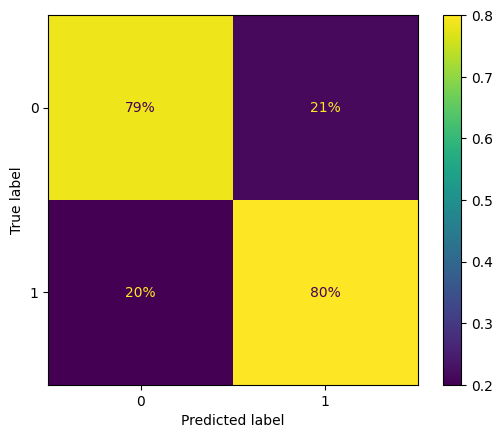

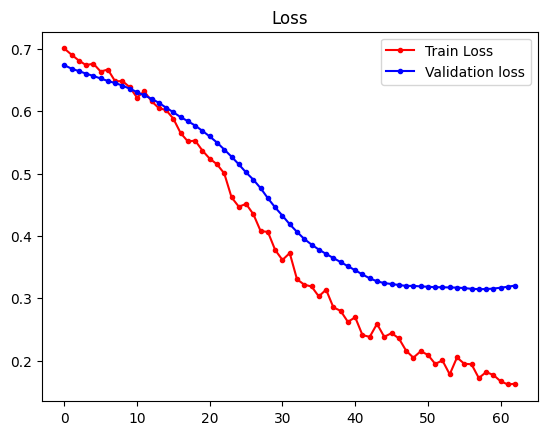

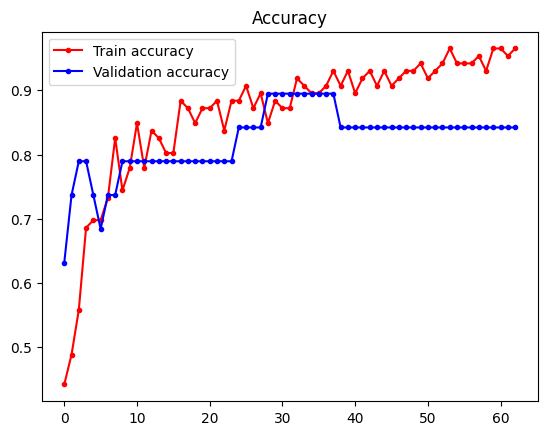

In [17]:
import pandas as pd
from functions import *
evaluate_model(model2, history2_2, X_test2, y_test2)

In [18]:
model2.evaluate(X_test2,y_test2)
model2.evaluate(X_val2,y_val2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.7895 - loss: 0.4524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8421 - loss: 0.3204


[0.3204309940338135, 0.8421052694320679]

Here we will test tensorboard another usefull evaluation tool thats what for we needed tensorboard callback created earlier this proved to work best on colaboratory platform 

# Importance of features  
Now we will try to acces importaonce of features we will start by calculating SHAP values. We will do that for our latest model based on 2 classes 

First we are going to need dataframe that will hold our features (bacteria familly names) as well as numeric encoding of them 

In [42]:
encoding_df = pd.DataFrame({'familly': predictors, "encoding": range(126)})
encoding_df

,familly,encoding
0,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,0
1,d__Bacteria;p__Cyanobacteria;c__Cyanobacteriia...,1
2,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,2
3,d__Bacteria;p__Desulfobacterota;c__Desulfobacc...,3
4,d__Bacteria;p__Planctomycetota;c__Planctomycet...,4
...,...,...
121,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,121
122,d__Bacteria;p__Desulfobacterota;c__Desulfobulb...,122
123,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,123
124,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__...,124


## SHAP_values

C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 19/19 [01:51<00:00,  5.87s/it]


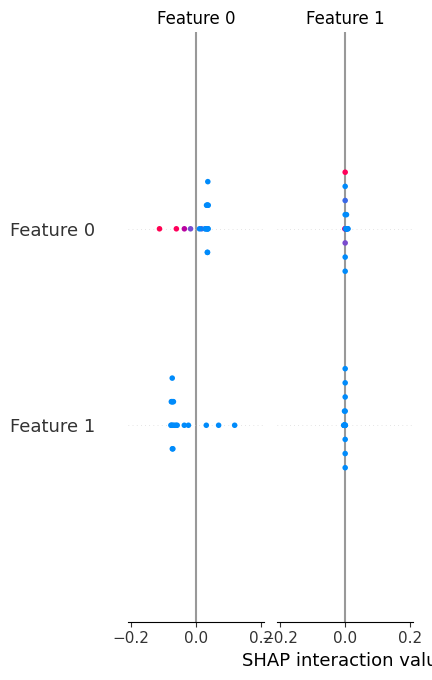

In [19]:
import shap   

# Create a SHAP explainer object
explainer = shap.KernelExplainer(model2, X_train2)   

# Calculate SHAP values
shap_values = explainer.shap_values(X_test2)   

# Plot the SHAP values
shap.summary_plot(shap_values, X_test2)   


In [100]:
# Convert shap_values to a DataFrame
#shape_values = shap_values[:,:,1]
shap_df = pd.DataFrame(shap_values)

# Save the DataFrame as a CSV file

#np.to_csv("shap_values.csv")
shap_df.columns = predictors
#shap_df.to_csv("shap_values_bacteria.csv", index=False)

In [43]:
shap_df = pd.read_csv("shap_values_bacteria.csv")
shap_values = np.array(shap_df)
predictors = shap_df.columns

In [34]:
# First we are going to filter features with mean shap value equal to 0 

# Calculate mean absolute SHAP value for each feature
mean_abs_shap = shap_df.abs().mean().reset_index(drop=True)

# Create a DataFrame without setting 'predictors' as the index
mean_abs_shap_df = pd.DataFrame(mean_abs_shap, columns=["SHAP"])

# Add 'predictors' as a separate column
mean_abs_shap_df['Predictors'] = shap_df.columns

# Optionally, if you want to sort the DataFrame by the SHAP values
# mean_abs_shap_df = mean_abs_shap_df.sort_values(by="SHAP", ascending=False)

mean_abs_shap_df_sorted  = mean_abs_shap_df.sort_values(by="SHAP", ascending=False)

# Reset the index to make it a column
mean_abs_shap_df_sorted = mean_abs_shap_df_sorted.reset_index()

# Optionally, if you want to rename the 'index' column to something more descriptive
mean_abs_shap_df_sorted.rename(columns={'index': 'feature_index'}, inplace=True)

print(mean_abs_shap_df_sorted.iloc[3,2])

d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Methylococcales;f__Methylomonadaceae


In [35]:
mean_abs_shap_df_sorted['Predictors'] = mean_abs_shap_df_sorted['Predictors'].str.split(';').str[-2].str.split('_').str[-1]
mean_abs_shap_df_sorted

,feature_index,SHAP,Predictors
0,13,0.055613,Erysipelotrichales
1,99,0.052677,Isosphaerales
2,72,0.041809,Aeromonadales
3,0,0.037055,Methylococcales
4,123,0.027013,Legionellales
...,...,...,...
121,110,0.000190,uncultured
122,89,0.000000,Spirochaetales
123,107,0.000000,Flavobacteriales
124,101,0.000000,Pseudomonadales


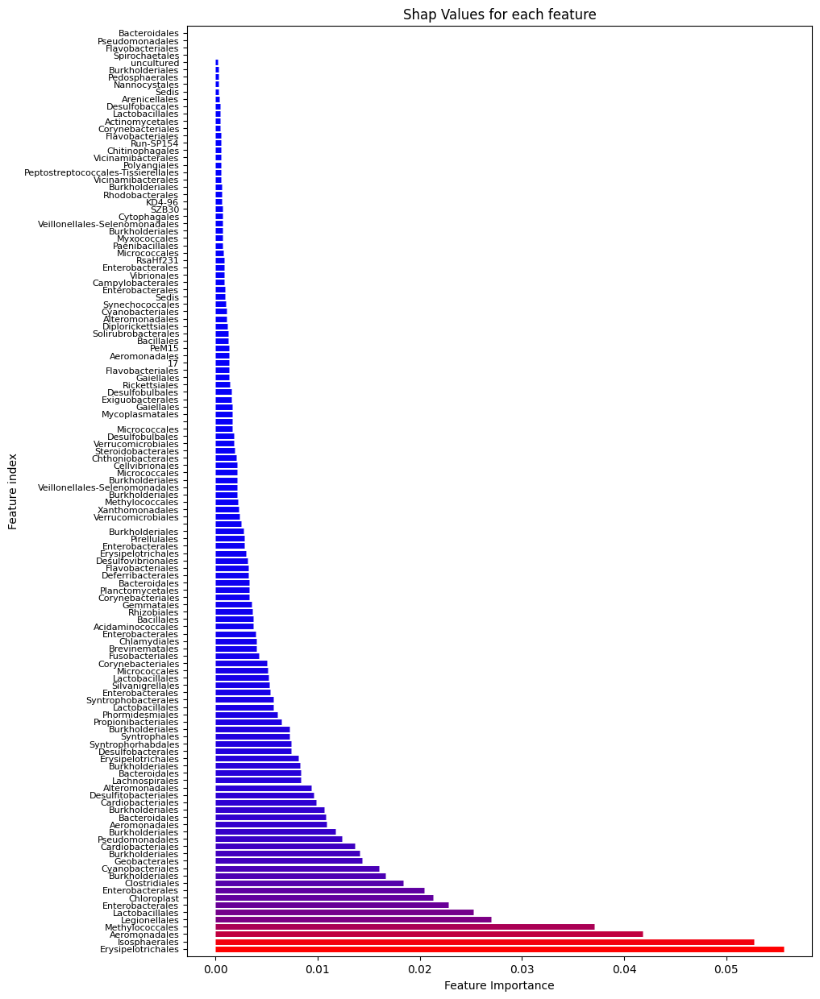

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors


# Create a colormap from blue to purple
cmap = colors.LinearSegmentedColormap.from_list("custom_blue_purple", ["blue", "red"])

# Normalize the SHAP values to the range [0, 1] for color mapping
norm = colors.Normalize(vmin=mean_abs_shap_df_sorted['SHAP'].min(), vmax=mean_abs_shap_df_sorted['SHAP'].max())

plt.figure(figsize=(10, 15))

# Assuming mean_abs_shap_df_sorted has a 'feature_index' column with the labels for the y-axis
y_ticks_labels = mean_abs_shap_df_sorted['Predictors'].tolist()

# Iterate through the DataFrame and plot each SHAP value as a horizontal line
for index, row in mean_abs_shap_df_sorted.iterrows():
    # Map the SHAP value to the colormap
    color = cmap(norm(row['SHAP']))
    plt.hlines(y=index, xmin=0, xmax=row['SHAP'], color=color, linestyle='-', linewidth=5)

# Adjust the y-axis limits to include all indices comfortably
plt.ylim(-1, len(mean_abs_shap_df_sorted))

# Set the y-axis ticks and labels with a smaller font size
plt.yticks(range(len(y_ticks_labels)), y_ticks_labels, fontsize= 8)  # You can also use a specific numeric value

plt.xlabel('Feature Importance')
plt.ylabel('Feature index')
plt.title('Shap Values for each feature')
plt.show()

Now having shap values we can simply check for normal distriburion to test if mean shap value is differeent from zero 

In [104]:
from scipy.stats import ttest_1samp 
from scipy.stats import shapiro
import statsmodels.stats.multitest as smm

tt_shap_pvalues = pd.DataFrame(index = range(shap_values.shape[1]), columns = ['mean','abs_mean','shapiro_pval','t_statistic', 'tt_p_value'])
tt_shap_pvalues["Feature"] = predictors
n_features = shap_values.shape[1]
for feature_id in range(n_features):
    feature_shap_values = shap_values[:, feature_id]
    
    t_statistic, p_value = ttest_1samp(feature_shap_values, 0, alternative='two-sided')
    shapiro_pval = shapiro(feature_shap_values)[1]
    tt_shap_pvalues.loc[feature_id, 'shapiro_pval'] = shapiro_pval
    tt_shap_pvalues.loc[feature_id, 't_statistic'] = t_statistic
    tt_shap_pvalues.loc[feature_id, 'tt_p_value'] = p_value
    tt_shap_pvalues.loc[feature_id, 'mean'] = feature_shap_values.mean()
    tt_shap_pvalues.loc[feature_id, 'abs_mean'] = np.abs(feature_shap_values).mean()

tt_shap_pvalues.loc[(tt_shap_pvalues['mean'] != 0) & (tt_shap_pvalues['shapiro_pval'] < 0.05)]

tt_shap_pvalues.loc[(tt_shap_pvalues['mean'] != 0) & (tt_shap_pvalues['tt_p_value'] < 0.05)]



# correction 

pvals = tt_shap_pvalues['tt_p_value'].astype(float)
rejected, pvals_corrected, _, _ = smm.multipletests(pvals, alpha=0.05, method='bonferroni')

# Add the corrected p-values to your DataFrame
tt_shap_pvalues['tt_p_value_corrected'] = pvals_corrected
tt_shap_pvalues['rejected'] = rejected  # True if hypothesis is rejected under FDR
filtered_results = tt_shap_pvalues.loc[(tt_shap_pvalues['mean'] != 0) & (tt_shap_pvalues['tt_p_value_corrected'] < 0.05)]

filtered_results



C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundatio

,mean,abs_mean,shapiro_pval,t_statistic,tt_p_value,Feature,tt_p_value_corrected,rejected
14,0.003178,0.003178,0.10844,12.189337,0.0,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__...,4.940023e-08,True
21,0.025216,0.025216,0.28681,12.244195,0.0,d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactob...,4.594281e-08,True
26,0.005073,0.005073,0.582307,22.167145,0.0,d__Bacteria;p__Actinobacteriota;c__Actinobacte...,2.040438e-12,True
31,-0.002664,0.002832,0.025522,-6.8659,0.000002,d__Bacteria;p__Proteobacteria;c__Gammaproteoba...,2.533369e-04,True
33,0.001778,0.001778,0.166923,5.97994,0.000012,d__Bacteria;p__Verrucomicrobiota;c__Verrucomic...,1.479609e-03,True
34,0.005142,0.006463,0.000025,4.697769,0.000179,d__Bacteria;p__Actinobacteriota;c__Actinobacte...,2.259492e-02,True
35,0.001244,0.001244,0.069612,5.056538,0.000082,d__Bacteria;p__Firmicutes;c__Bacilli;o__Bacill...,1.035237e-02,True
37,0.001584,0.001584,0.091801,5.201294,0.00006,d__Bacteria;p__Firmicutes;c__Bacilli;o__Exiguo...,7.582248e-03,True
39,0.001673,0.001673,0.075912,5.332355,0.000045,d__Bacteria;p__Actinobacteriota;c__Actinobacte...,5.730439e-03,True
41,-0.00333,0.00333,0.340187,-10.77575,0.0,d__Bacteria;p__Actinobacteriota;c__Actinobacte...,3.521554e-07,True


In [105]:
filtered_results['Feature'] = filtered_results['Feature'].str.split(';').str[-2].str.split('_').str[-1]
filtered_results.iloc[18,5] = "Vicinamibacteria"
filtered_results.iloc[14,5] = "Hafniaceae"

filtered_results_sorted = filtered_results.sort_values(by="abs_mean", ascending=False)

filtered_index = filtered_results_sorted.index
filtered_results_sorted

C:\Users\marek\AppData\Local\Temp\ipykernel_16524\1570724963.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_results['Feature'] = filtered_results['Feature'].str.split(';').str[-2].str.split('_').str[-1]


,mean,abs_mean,shapiro_pval,t_statistic,tt_p_value,Feature,tt_p_value_corrected,rejected
21,0.025216,0.025216,0.28681,12.244195,0.0,Lactobacillales,4.594281e-08,True
95,-0.009831,0.009831,0.001614,-13.924644,0.0,Cardiobacteriales,5.601186e-09,True
45,-0.007171,0.007242,0.00241,-9.559612,0.0,Syntrophales,2.240217e-06,True
34,0.005142,0.006463,0.000025,4.697769,0.000179,Propionibacteriales,2.259492e-02,True
86,0.006056,0.006056,0.265293,16.471937,0.0,Phormidesmiales,3.358510e-10,True
118,0.005697,0.005697,0.85533,9.514024,0.0,Lactobacillales,2.408732e-06,True
125,-0.005241,0.005241,0.006042,-10.048408,0.0,Silvanigrellales,1.044648e-06,True
26,0.005073,0.005073,0.582307,22.167145,0.0,Micrococcales,2.040438e-12,True
46,-0.003976,0.003976,0.391661,-12.04217,0.0,Chlamydiales,6.009331e-08,True
62,0.003888,0.003888,0.67628,10.278866,0.0,Enterobacterales,7.357318e-07,True


In [112]:
significant_rows = filtered_results_sorted

significant_rows.rename(columns={'abs_mean': 'SHAP'}, inplace=True)
significant_rows['feature_id'] = significant_rows.index
significant_rows.reset_index(drop=True, inplace=True)
significant_rows


,mean,SHAP,shapiro_pval,t_statistic,tt_p_value,Feature,tt_p_value_corrected,rejected,feature_id
0,0.025216,0.025216,0.28681,12.244195,0.0,Lactobacillales,4.594281e-08,True,21
1,-0.009831,0.009831,0.001614,-13.924644,0.0,Cardiobacteriales,5.601186e-09,True,95
2,-0.007171,0.007242,0.00241,-9.559612,0.0,Syntrophales,2.240217e-06,True,45
3,0.005142,0.006463,0.000025,4.697769,0.000179,Propionibacteriales,2.259492e-02,True,34
4,0.006056,0.006056,0.265293,16.471937,0.0,Phormidesmiales,3.358510e-10,True,86
5,0.005697,0.005697,0.85533,9.514024,0.0,Lactobacillales,2.408732e-06,True,118
6,-0.005241,0.005241,0.006042,-10.048408,0.0,Silvanigrellales,1.044648e-06,True,125
7,0.005073,0.005073,0.582307,22.167145,0.0,Micrococcales,2.040438e-12,True,26
8,-0.003976,0.003976,0.391661,-12.04217,0.0,Chlamydiales,6.009331e-08,True,46
9,0.003888,0.003888,0.67628,10.278866,0.0,Enterobacterales,7.357318e-07,True,62


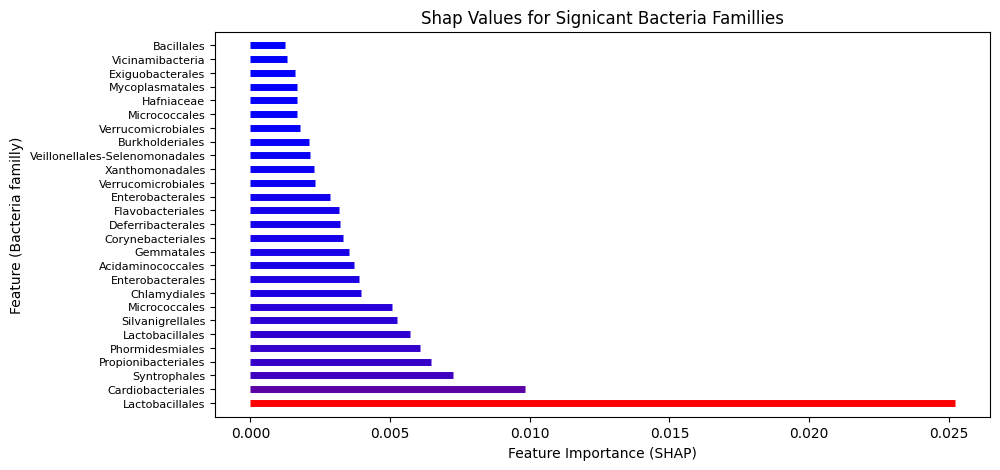

In [114]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
# we will create same plot for only siggnificant features

# Create a colormap from blue to purple
cmap = colors.LinearSegmentedColormap.from_list("custom_blue_purple", ["blue", "red"])

# Normalize the SHAP values to the range [0, 1] for color mapping
norm = colors.Normalize(vmin=significant_rows['SHAP'].min(), vmax=significant_rows['SHAP'].max())

plt.figure(figsize=(10, 5))

# Assuming mean_abs_shap_df_sorted has a 'feature_index' column with the labels for the y-axis
y_ticks_labels = significant_rows['Feature'].tolist()

# Iterate through the DataFrame and plot each SHAP value as a horizontal line
for index, row in significant_rows.iterrows():
    # Map the SHAP value to the colormap
    color = cmap(norm(row['SHAP']))
    plt.hlines(y=index, xmin=0, xmax=row['SHAP'], color=color, linestyle='-', linewidth=5)

# Adjust the y-axis limits to include all indices comfortably
plt.ylim(-1, len(significant_rows))

# Set the y-axis ticks and labels with a smaller font size
plt.yticks(range(len(y_ticks_labels)), y_ticks_labels, fontsize= 8)  # You can also use a specific numeric value

plt.xlabel('Feature Importance (SHAP)')
plt.ylabel('Feature (Bacteria familly)')
plt.title('Shap Values for Signicant Bacteria Famillies')
plt.show()

# Column/feature altering
Here we will test 3 approaches to column altering 
Permutation where we will permute random column
Zeroing each column
Replacing all values form a column with random values from uniform distribution

### Permutation

In [22]:
from IPython.display import clear_output

In [23]:
df2_test = pd.DataFrame(X_test2.copy(),columns = df.columns[1:])

In [24]:
df2_test.head()

,d__Bacteria;p__Firmicutes;c__Bacilli;o__Erysipelotrichales;f__Erysipelotrichaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Aeromonadales;f__Aeromonadaceae,d__Bacteria;p__Firmicutes;c__Clostridia;o__Clostridiales;f__Clostridiaceae,d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Enterococcaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Yersiniaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;__;__,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Enterobacteriaceae,d__Bacteria;p__Fusobacteriota;c__Fusobacteriia;o__Fusobacteriales;f__Fusobacteriaceae,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__Bacteroidales;f__Dysgonomonadaceae,d__Bacteria;p__Firmicutes;c__Bacilli;o__Erysipelotrichales;f__Erysipelatoclostridiaceae,...,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Alteromonadales;f__Alteromonadaceae,d__Bacteria;p__Acidobacteriota;c__Vicinamibacteria;o__Vicinamibacterales;f__uncultured,d__Bacteria;p__Verrucomicrobiota;c__Verrucomicrobiae;o__Pedosphaerales;f__Pedosphaeraceae,d__Bacteria;p__Firmicutes;c__Negativicutes;o__Veillonellales-Selenomonadales;f__Sporomusaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Burkholderiales;f__Alcaligenaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Vibrionales;f__Vibrionaceae,d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Pseudomonadales;f__Moraxellaceae,d__Bacteria;p__Bacteroidota;c__Bacteroidia;o__Flavobacteriales;f__Crocinitomicaceae,d__Bacteria;p__Campilobacterota;c__Campylobacteria;o__Campylobacterales;f__Arcobacteraceae,d__Bacteria;p__Actinobacteriota;c__Actinobacteria;o__Actinomycetales;f__Actinomycetaceae
0,0.098131,0.0,0.000000,0.0,0.0,0.067568,0.269610,0.022245,0.0,0.0,...,0.0,0.121053,0.0,0.000000,0.0,0.0,0.073826,0.0,0.0,0.0
1,0.233645,0.0,0.105263,0.0,0.0,0.209459,0.085321,0.028311,0.0,0.0,...,0.0,0.000000,0.0,0.143646,0.0,0.0,0.013423,0.0,0.0,0.0
2,0.000000,0.0,0.000000,0.0,0.0,0.391892,0.235589,0.108190,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0
3,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.447362,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.022099,0.0,0.0,0.000000,0.0,0.0,0.0
4,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.574809,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0


In [25]:
df_test = pd.DataFrame(X_test2.copy())
df_train = pd.DataFrame(X_train2.copy())

In [26]:
# collumn permutation
results_dfp = pd.DataFrame(columns=['feature', 'train_loss', 'train_acc', 'test_loss', 'test_acc'])
def permute_column(column):
    return np.random.permutation(column)

# Permute data in each column
N = 100



feature = [0]*N
train_loss = [0]*N
train_acc = [0]*N
test_loss = [0]*N
test_acc = [0]*N
for column in df_test.columns:
    
    for i in range(N):
        
        print(f"processing {column}")
        print(f'{i/N*100}% procesing {i} out of {N}')
    
        dfp_train = df_train.copy()
        dfp_test = df_test.copy()


        permuted_column_train = np.random.permutation(dfp_train[column])
        permuted_column_test = np.random.permutation(dfp_test[column])

    # Update the DataFrame with the permuted column
        dfp_train[column] = permuted_column_train
        dfp_test[column] = permuted_column_test

        ev_train = model2.evaluate(dfp_train, y_train2)
        ev_test = model2.evaluate(dfp_test, y_test2)

        feature[i]=str(column)
        train_loss[i]=ev_train[0]
        train_acc[i]=ev_train[1]
        test_loss[i]=ev_test[0]
        test_acc[i]=ev_test[1]
        clear_output(wait=True)

    col_df = pd.DataFrame({'feature':feature ,'train_loss':train_loss,'train_acc':train_acc ,'test_loss':test_loss ,'test_acc':test_acc })
    results_dfp = pd.concat([results_dfp, col_df],ignore_index = True)
    

processing 0
53.0% procesing 53 out of 100


KeyboardInterrupt: 

In [ ]:
#results_dfp.to_csv('results_df_12500.csv', index=False)
results_dfp = pd.read_csv('results_dfp_12500.csv')

,feature,train_loss,train_acc,test_loss,test_acc
0,0,0.181770,0.930233,0.341733,0.868421
1,0,0.181770,0.930233,0.342038,0.868421
2,0,0.181708,0.930233,0.342051,0.868421
3,0,0.181646,0.930233,0.342067,0.868421
4,0,0.181701,0.930233,0.341828,0.868421
...,...,...,...,...,...
12595,125,0.182781,0.930233,0.388951,0.842105
12596,125,0.186962,0.930233,0.338350,0.868421
12597,125,0.182607,0.930233,0.399835,0.842105
12598,125,0.183059,0.930233,0.346310,0.868421


In [ ]:
from scipy import stats

<Axes: xlabel='feature'>

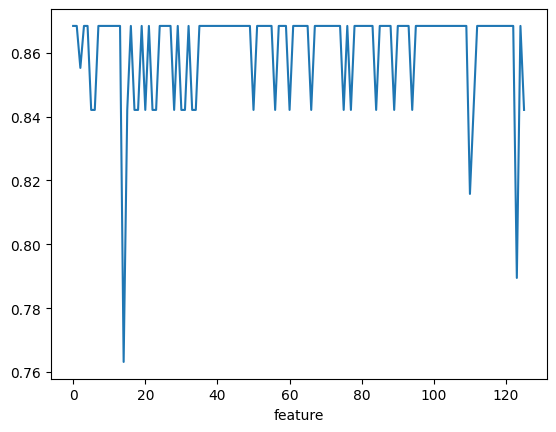

In [ ]:
results_dfp.groupby('feature').median()['test_acc'].plot()

AttributeError: module 'tensorflow' has no attribute 'Constant'

<Axes: >

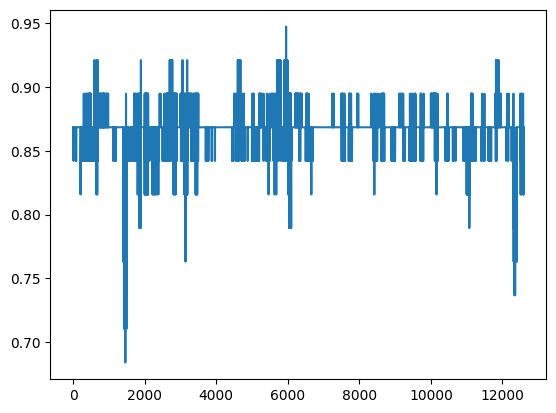

In [ ]:
results_dfp['test_acc'].plot()

In [ ]:
grouped_dfp = results_dfp.groupby('feature').mean().reset_index()

In [ ]:
results_dfp.loc[results_dfp['feature']== '1'].hist()
plt.show()

<Axes: >

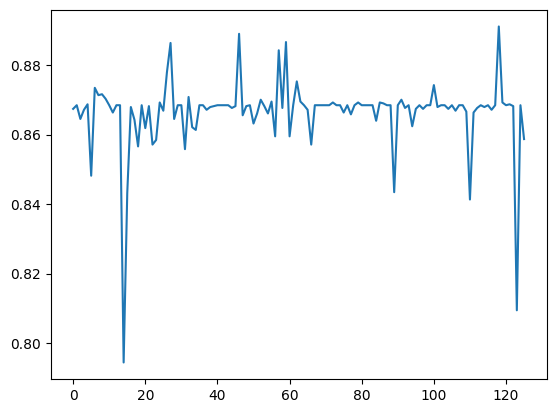

In [ ]:
grouped_dfp['test_acc'].plot()

In [ ]:
stats_dfp = pd.DataFrame(columns = ['feature','shapiro_pval','shapiro_pval_log','shapiro_pval_exp','tt_pval'])

In [ ]:
stats_dfp

,feature,shapiro_pval,shapiro_pval_log,shapiro_pval_exp,tt_pval
0,0,1.349327e-20,1.0,1.501516e-20,NaN
1,1,1.233280e-20,1.0,1.316181e-20,NaN
2,2,1.692502e-20,1.0,2.092616e-20,NaN
3,3,1.982285e-20,1.0,2.673441e-20,NaN
4,4,2.136653e-20,1.0,2.998470e-20,NaN
...,...,...,...,...,...
121,121,1.474126e-20,1.0,1.719788e-20,NaN
122,122,1.261897e-20,1.0,1.361043e-20,NaN
123,123,1.569916e-19,1.0,5.573284e-19,NaN
124,124,1.233280e-20,1.0,1.316181e-20,NaN


In [ ]:
base_acc = 0.8684

for feature in results_dfp['feature'].unique():
    sample = results_dfp.loc[results_dfp['feature']== feature]
    sample_acc = sample['test_acc']
    
    sample_acc_log = np.log(sample_acc)
    sample_acc_exp = np.exp(sample_acc)
    _ , pval = stats.shapiro(sample_acc)
    _ , pval_log = stats.shapiro(sample_acc_log)
    _ , pval_exp = stats.shapiro(sample_acc_exp)
    
    #features.append(feature)
    #shap_pvalues.append(pval)
    if pval > 0.05:
        t_statistic, tpval = stats.ttest_1samp(sample_acc,base_acc)
    else:
        tpval = pd.NA
        #tt_pvalues.append(tpval)
    
    col_df = pd.DataFrame({'feature':[feature] ,'shapiro_pval':[pval],'shapiro_pval_log':[pval_log],'shapiro_pval_exp':[pval_exp],'tt_pval':[tpval]})
    stats_dfp = pd.concat([stats_dfp, col_df],ignore_index = True)

C:\Users\marek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\marek\AppData\Local\Temp\ipykernel_30188\2864085917.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stats_dfp = pd.concat([stats_dfp, col_df],ignore_index = True)


In [ ]:
#stats_dfp.to_csv('stats_dfp.csv')

In [ ]:
stats_dfp.describe()

,shapiro_pval,shapiro_pval_log,shapiro_pval_exp
count,1.260000e+02,126.0,1.260000e+02
mean,2.332455e-20,1.0,4.877419e-20
std,3.733444e-20,0.0,1.903206e-19
min,1.233280e-20,1.0,1.316181e-20
25%,1.233280e-20,1.0,1.316181e-20
50%,1.413259e-20,1.0,1.613031e-20
75%,2.204359e-20,1.0,3.125533e-20
max,3.968928e-19,1.0,2.080158e-18


In [ ]:
#bonferoni
for i in range(len(tt_pvalues)):
    tt_pvalues[i]=tt_pvalues[i]*126

In [ ]:
results_dfp.describe()

,feature,train_loss,train_acc,test_loss,test_acc
count,25200.000000,25200.000000,25200.000000,25200.000000,25200.000000
mean,62.500000,0.108414,0.543124,0.203574,0.506738
std,36.372643,0.091657,0.457495,0.172420,0.426959
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,31.000000,0.000000,0.000000,0.000000,0.000000
50%,62.500000,0.178375,0.930233,0.339115,0.868421
75%,94.000000,0.182906,0.930233,0.343253,0.868421
max,125.000000,0.288048,0.965116,0.624213,0.947368


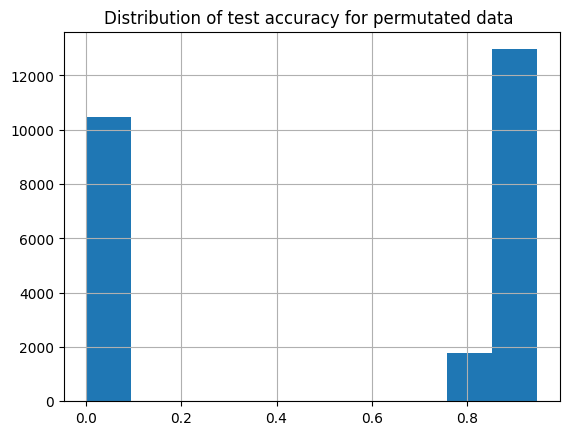

Text(0.5, 1.0, 'Distribution of test loss for permutated data ')

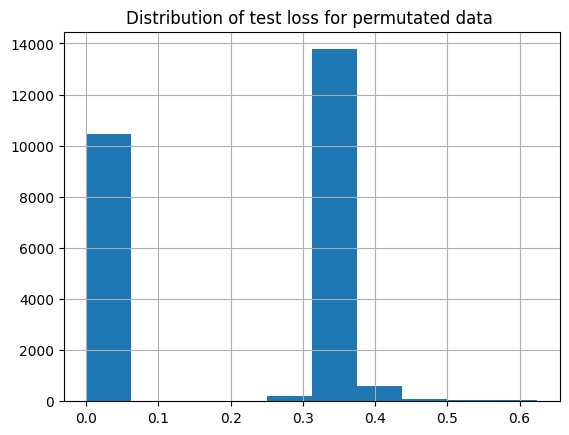

In [ ]:
results_dfp['test_acc'].hist()
plt.title("Distribution of test accuracy for permutated data ")
plt.show()
results_dfp['test_loss'].hist()
plt.title("Distribution of test loss for permutated data ")

### Zeroing

In [ ]:
def permute_column(column):
    return np.random.permutation(column)

# Permute data in each column
N = 3000



feature = [0]*N
train_loss = [0]*N
train_acc = [0]*N
test_loss = [0]*N
test_acc = [0]*N
for i in range(N):
    print(f'{i/N*100}% procesing {i} out of {N}')
    
    dfp_train = pd.DataFrame(X_train2.copy())
    dfp_test = pd.DataFrame(X_test2.copy())


    
    # Select a random column
    random_column = np.random.choice(dfp_train.columns)
    print(random_column)
    # Permute the data in the selected column
    #permuted_column_train = np.random.permutation(dfp_train[random_column])
    #permuted_column_test = np.random.permutation(dfp_test[random_column])

    # Update the DataFrame with the permuted column
    dfp_train[random_column] = 0
    dfp_test[random_column] = 0

    ev_train = model2.evaluate(dfp_train, y_train2)
    ev_test = model2.evaluate(dfp_test, y_test2)

    feature[i]=str(random_column)
    train_loss[i]=ev_train[0]
    train_acc[i]=ev_train[1]
    test_loss[i]=ev_test[0]
    test_acc[i]=ev_test[1]

    # new_row = pd.DataFrame({'feature': random_column,
    # 'train_loss': ev_train[0],
    # 'train_acc': ev_train[1],
    # 'test_loss': ev_test[0],
    # 'test_acc' : ev_test[1]})
    
    # results_df = pd.concat([results_df, new_row])
    
    

In [ ]:
results_df_zeros = pd.DataFrame({'feature':feature ,'train_loss':train_loss,'train_acc':train_acc ,'test_loss':test_loss ,'test_acc':test_acc })

In [ ]:
#results_df_zeros.to_csv('results_df_zeros.csv', index=False)

In [ ]:
results_df_zeros['test_acc'].hist()
plt.title("Distribution of test accuracy for zeroed data")
plt.show()
results_df_zeros['test_loss'].hist()
plt.title("Distribution of test loss for zeroed data")

In [ ]:
results_df_zeros
rdz = results_df_zeros.copy()
features = results_df_zeros['feature'].unique()
means_train_acc = []

mean_df = rdz.groupby('feature').mean().reset_index()
mean_df_p = results_df.groupby('feature').mean().reset_index()
mean_df_p

### Random unif variables
here instead of permuting or replacing with zeroes (as there is a lot of zeroes already we will fill random collumn with unif distributed numbers 

In [ ]:
# collumn permutation
results_dfu = pd.DataFrame(columns=['feature', 'train_loss', 'train_acc', 'test_loss', 'test_acc'])

N = 100



feature = [0]*N
train_loss = [0]*N
train_acc = [0]*N
test_loss = [0]*N
test_acc = [0]*N
for column in df_test.columns:
    
    for i in range(N):
        
        print(f"processing {column}")
        print(f'{i/N*100}% procesing {i} out of {N}')
    
        dfu_train = df_train.copy()
        dfu_test = df_test.copy()


        
        random_numbers_test = np.random.uniform(low=0, high=1, size=(dfu_test.shape[0], 1))
        random_numbers_train = np.random.uniform(low=0, high=1, size=(dfu_train.shape[0], 1))
        
    # Update the DataFrame with the permuted column
        dfu_train[column] = random_numbers_train
        dfu_test[column] = random_numbers_test

        ev_train = model2.evaluate(dfu_train, y_train2)
        ev_test = model2.evaluate(dfu_test, y_test2)

        feature[i]=str(column)
        train_loss[i]=ev_train[0]
        train_acc[i]=ev_train[1]
        test_loss[i]=ev_test[0]
        test_acc[i]=ev_test[1]
        clear_output(wait=True)

    col_df = pd.DataFrame({'feature':feature ,'train_loss':train_loss,'train_acc':train_acc ,'test_loss':test_loss ,'test_acc':test_acc })
    
    results_dfu = pd.concat([results_dfu, col_df],ignore_index = True)
    

In [ ]:
#results_dfu.to_csv('results_dfu_12500.csv', index=False)
results_dfu = pd.read_csv('results_dfu_12500.csv')

In [ ]:
results_dfu

,feature,train_loss,train_acc,test_loss,test_acc
0,0,0.188859,0.918605,0.342868,0.868421
1,0,0.188644,0.918605,0.342582,0.868421
2,0,0.187844,0.930233,0.336108,0.868421
3,0,0.195839,0.918605,0.344920,0.842105
4,0,0.191240,0.930233,0.344718,0.868421
...,...,...,...,...,...
12595,125,0.268409,0.895349,0.410292,0.868421
12596,125,0.325587,0.848837,0.483891,0.789474
12597,125,0.285425,0.895349,0.469763,0.763158
12598,125,0.246670,0.895349,0.411156,0.815789


<Axes: >

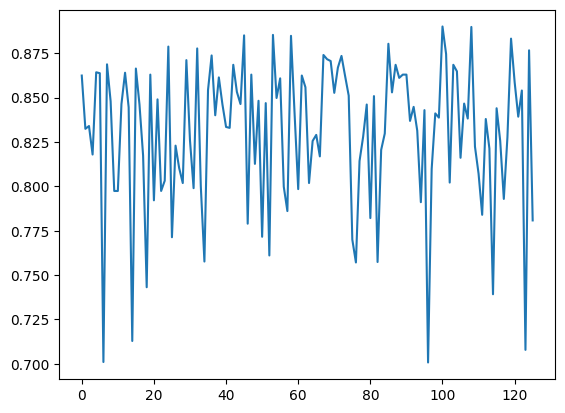

In [ ]:


#features = results_df_zeros['feature'].unique()

mean_dfu = results_dfu.groupby('feature').mean().reset_index()
mean_dfu['test_acc'].plot()

In [ ]:
base_acc = 0.8684
stats_dfu = pd.DataFrame(columns = ['feature','shapiro_pval','shapiro_pval_log','shapiro_pval_exp','tt_pval'])

for feature in results_dfu['feature'].unique():
    sample = results_dfu.loc[results_dfp['feature']== feature]
    sample_acc = sample['test_acc']
    
    sample_acc_log = np.log(sample_acc)
    sample_acc_exp = np.exp(sample_acc)
    _ , pval = stats.shapiro(sample_acc)
    _ , pval_log = stats.shapiro(sample_acc_log)
    _ , pval_exp = stats.shapiro(sample_acc_exp)

    if pval > 0.05:
        t_statistic, tpval = stats.ttest_1samp(sample_acc,base_acc)
    else:
        tpval = pd.NA

    
    col_df = pd.DataFrame({'feature':[feature] ,'shapiro_pval':[pval],'shapiro_pval_log':[pval_log],'shapiro_pval_exp':[pval_exp],'tt_pval':[tpval]})
    stats_dfu = pd.concat([stats_dfu, col_df],ignore_index = True)
    

C:\Users\marek\AppData\Local\Temp\ipykernel_30188\3333693127.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stats_dfu = pd.concat([stats_dfu, col_df],ignore_index = True)
C:\Users\marek\AppData\Local\Temp\ipykernel_30188\3333693127.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  stats_dfu = pd.concat([stats_dfu, col_df],ignore_index = True)
C:\Users\marek\AppData\Local\Temp\ipykernel_30188\3333693127.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA en

In [ ]:
stats_dfu.describe()

,shapiro_pval,shapiro_pval_log,shapiro_pval_exp,tt_pval
count,2.520000e+02,2.520000e+02,2.520000e+02,6.0
mean,2.415633e-02,2.400439e-02,2.427557e-02,0.0
std,1.527093e-01,1.527290e-01,1.526993e-01,0.0
min,2.964691e-20,2.964691e-20,2.964691e-20,0.0
25%,5.060473e-12,5.113202e-12,4.971215e-12,0.0
50%,1.577254e-06,1.625022e-06,1.499931e-06,0.0
75%,2.211206e-04,1.778677e-04,1.827672e-04,0.0
max,1.000000e+00,1.000000e+00,1.000000e+00,0.0


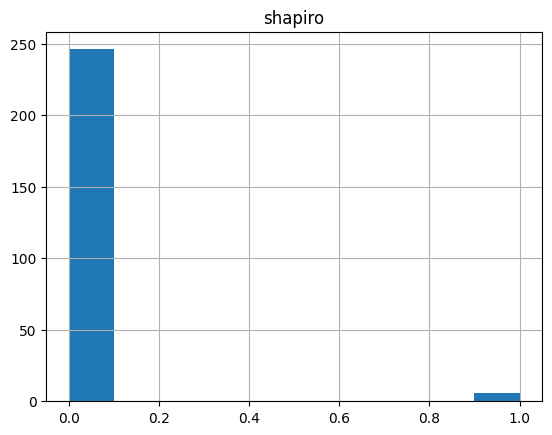

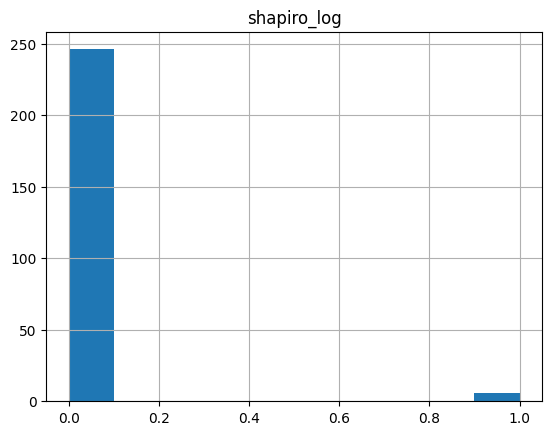

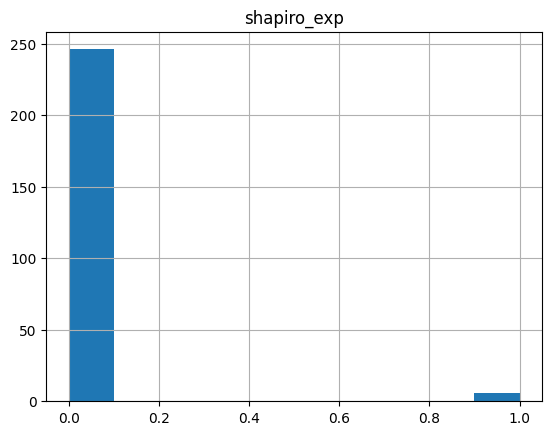

In [ ]:
stats_dfu['shapiro_pval'].hist()
plt.title("shapiro")
plt.show()
stats_dfu['shapiro_pval_log'].hist()
plt.title("shapiro_log")
plt.show()
stats_dfu['shapiro_pval_exp'].hist()
plt.title("shapiro_exp")
plt.show()


In [ ]:
#stats_dfu.to_csv('stats_dfu.csv')

In [ ]:
stats_dfu.loc[stats_dfu['shapiro_pval']> 0.05,:]

,feature,shapiro_pval,shapiro_pval_log,shapiro_pval_exp,tt_pval
42,42,1.0,1.0,1.0,0.0
87,87,1.0,1.0,1.0,0.0
103,103,1.0,1.0,1.0,0.0
168,42,1.0,1.0,1.0,0.0
213,87,1.0,1.0,1.0,0.0
229,103,1.0,1.0,1.0,0.0


### Results

In [ ]:
['test_acc'].plot()
mean_df_u['train_acc'].plot()
plt.title("Random unif replaced features")
plt.legend()

NameError: name 'mean_df_u' is not defined

In [ ]:
mean_df['test_acc'].plot()
mean_df['train_acc'].plot()
plt.title("Zeroed features")
plt.legend()

NameError: name 'mean_df' is not defined

In [ ]:
mean_df['test_loss'].plot()
mean_df['train_loss'].plot()
plt.title("loss permuted features")
plt.legend()

NameError: name 'mean_df' is not defined

In [ ]:
mean_df_p['test_acc'].plot()
mean_df_p['train_acc'].plot()
plt.title("Acc permuted features")
plt.legend()

In [ ]:
mean_df_p["test_acc"].mean()

Here we wil extract bacteria familly which affected model the most 

In [ ]:

# Extract the column names from df1
column_names = df.columns.tolist()

# Assign the column names to a column in df2
#df2['new_column'] = column_names
print(column_names[74])
print(column_names[115])
print(column_names[56])

In [ ]:
mean_df_p['bacteria'] = column_names[1:]

In [ ]:
sorted_mean_df_p=mean_df_p.sort_values(by="test_acc")
print(sorted_mean_df_p["bacteria"].head(3))

We will also check correlation between features


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Compute the correlation matrix
correlation_matrix = df.iloc[:,1:].corr(method='pearson')  # You can change 'pearson' to 'kendall' or 'spearman'


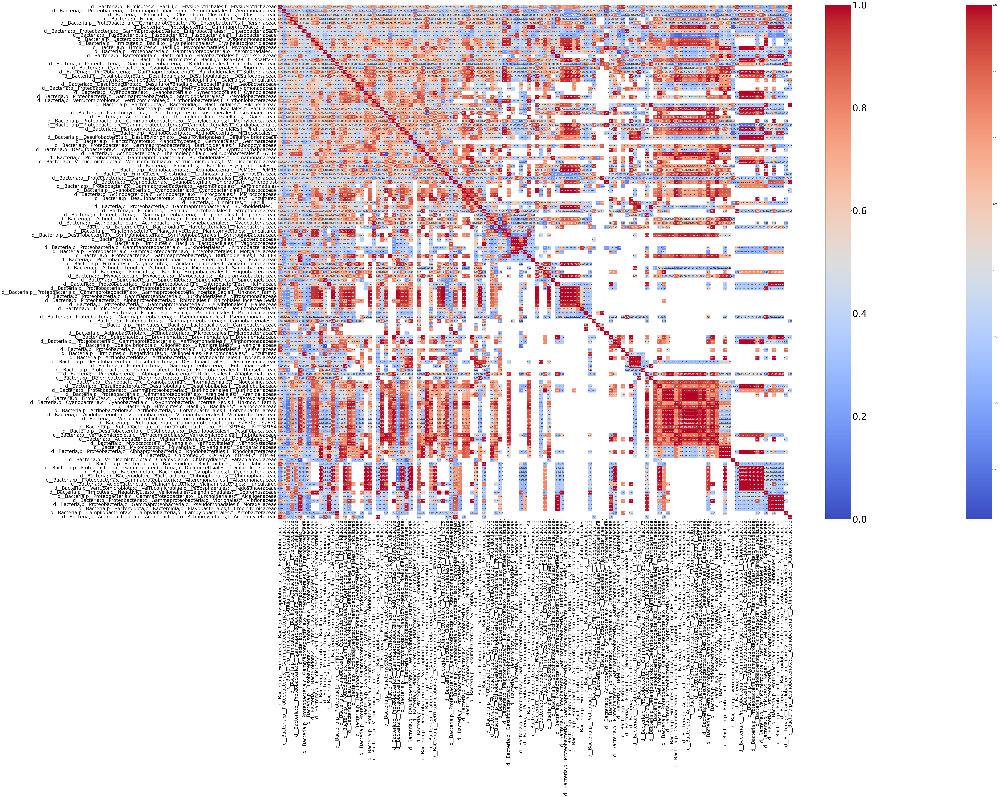

In [25]:
plt.figure(figsize=(80, 50))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.colorbar(plt.gca().imshow([[0, 1], [0, 1]], cmap='coolwarm')).ax.tick_params(labelsize=50)
plt.colorbar(plt.gca().imshow([[0, 1], [0, 1]], cmap='coolwarm')).remove()
plt.savefig('heatmap_bacteria.png')
plt.show()


